<a href="https://colab.research.google.com/github/B11GDEN/cvr_homework/blob/main/cv_hw3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Домашнее задание 3

1) [1 балл] Реализуйте чтение изображений, лежащих в /data/imgs/arrow (как в демо с калибровкой камеры с семинара). Вся обязательная часть задания выполняется с этими изображениями

1) [2 балла] Реализуйте нахождение расстояния от камеры до листка, учитывая, что это тот же листок, что был в первом демо

2) [3 балла] Реализуйте приведение изображения листка к "виду сверху"

3) [6 баллов] Реализуйте определение направления, в котором указывает стрелка. Можно использовать скелетонизацию из первого семинара по зрению: получить маску темной области (стрелки) внутри изображения листка, применить скелетонизацию, вычислить направление. Можно поступить иначе: после нахождения маски вычислить градиенты Собеля по x и y и проанализировать их направления. P.S. Можно использовать и полностью свой метод

4) [3 балла] Доп. задача 1: Примените написанный Вами код к видео https://drive.google.com/file/d/1AQhg2lL5FL4edlOcxY2SHOOZ-v9TgHBD/view?usp=sharing. Загрузите видео на свой гугл диск, а затем дополните имеющийся код монтированием диска и чтением в цикле кадров видео, приведёнными в конце семинара

5) [5 баллов] Доп. задача 2: определите, нормально ли видно листок в кадре. На некоторых кадрах его видно не полностью, один или больше уголков находятся за кадром. Это можно автоматически обнаруживать, к примеру используя размеры стрелки, и выводить на соответствующем кадре маркер - текст или цветную метку

In [100]:
!git clone https://github.com/B11GDEN/cvr_course.git

Cloning into 'cvr_course'...
remote: Enumerating objects: 496, done.
remote: Total 496 (delta 0), reused 0 (delta 0), pack-reused 496
Receiving objects: 100% (496/496), 60.34 MiB | 37.91 MiB/s, done.
Resolving deltas: 100% (110/110), done.


In [101]:
cd cvr_course/notebooks

/content/cvr_course/notebooks/cvr_course/notebooks


In [191]:
import numpy as np
import cv2
import time
import os
import math
from math import atan
import sys
import glob
from math import atanh
from random import randrange
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (10,10)

1) [1 балл] Реализуйте чтение изображений, лежащих в /data/imgs/arrow (как в демо с калибровкой камеры с семинара). Вся обязательная часть задания выполняется с этими изображениями

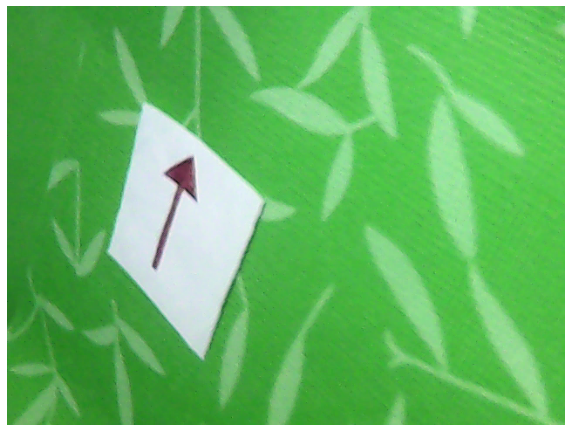

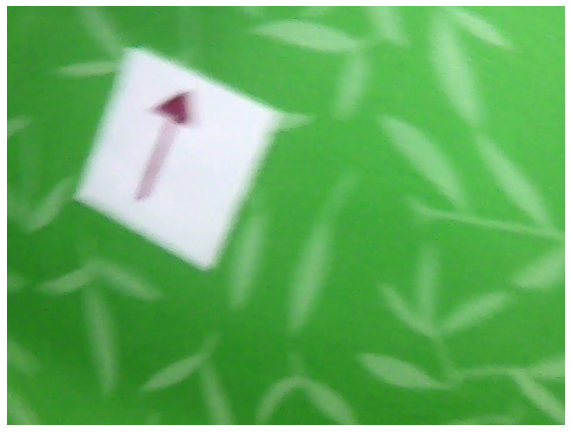

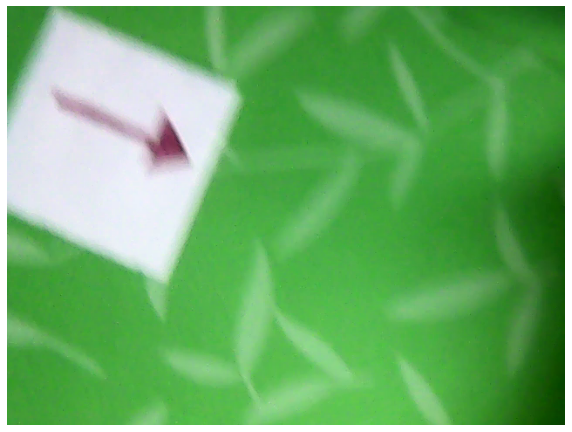

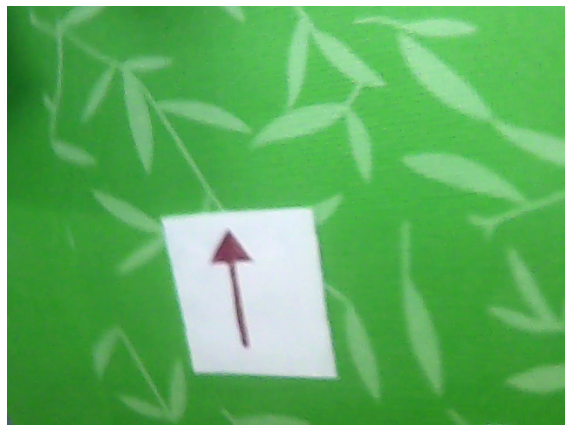

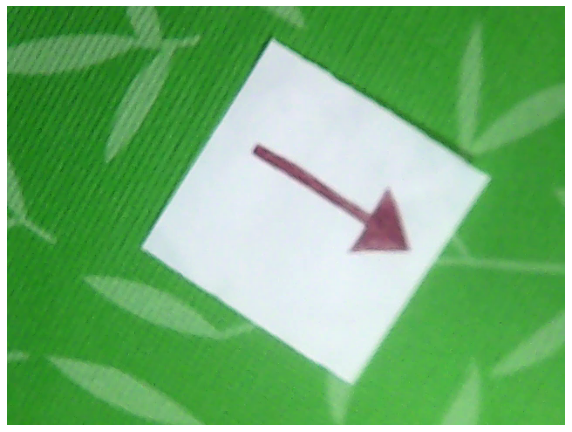

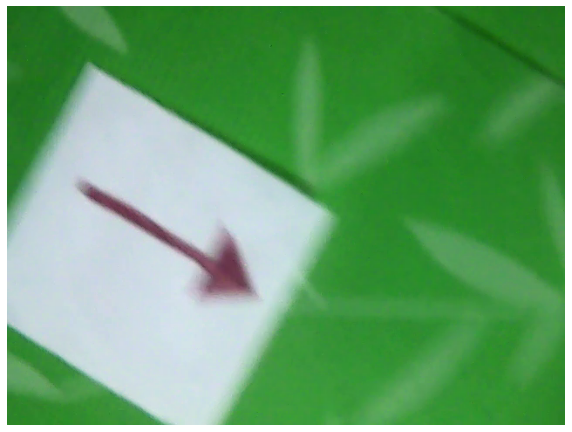

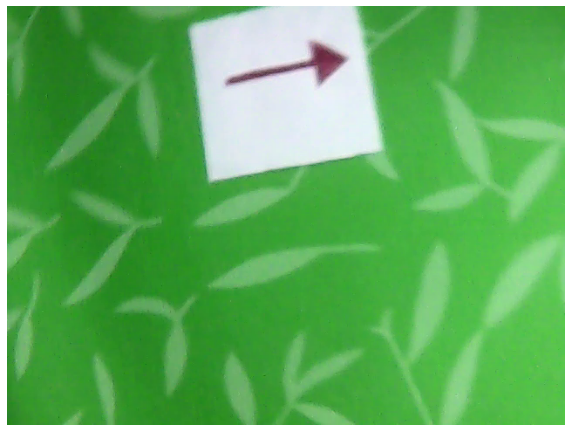

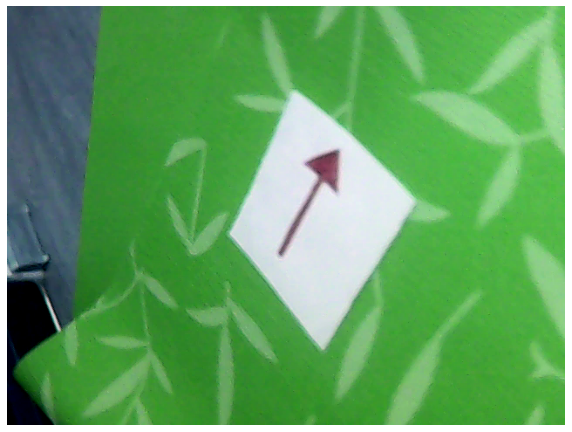

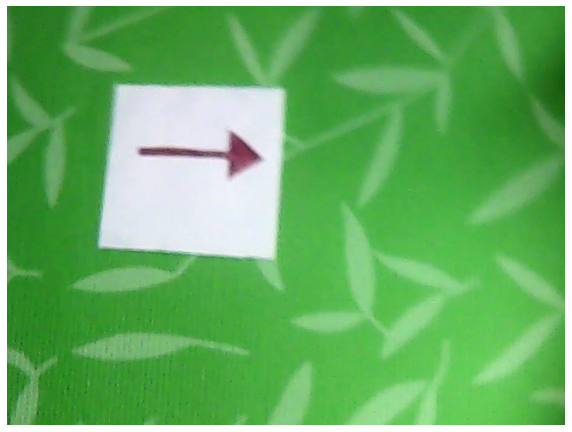

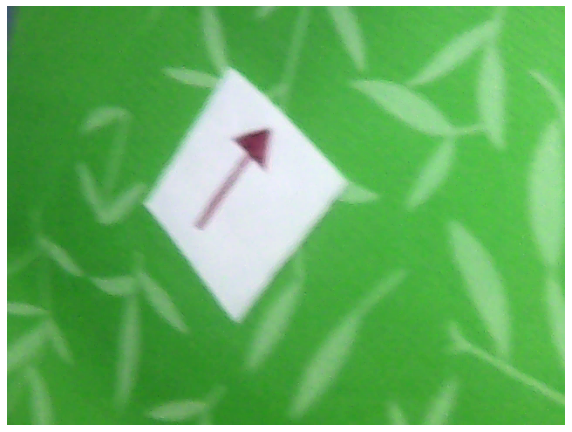

In [105]:
images = glob.glob('../data/imgs/arrow/*.png')
for fname in images:
    img = cv2.imread (fname, cv2.IMREAD_COLOR)
    img_rgb = cv2.cvtColor (img, cv2.COLOR_BGR2RGB)

    plt.imshow (img)
    plt.axis ('off')
    plt.show ()

1) [2 балла] Реализуйте нахождение расстояния от камеры до листка, учитывая, что это тот же листок, что был в первом демо

In [256]:
def find_contour (img, low_th, high_th, verbose = False):
    img_rgb = cv2.cvtColor (img, cv2.COLOR_BGR2RGB)
    
    mask = cv2.inRange (img, low_th, high_th)

    if verbose:
        plt.imshow(mask)
        plt.show()
    
    contours, hierarchy = cv2.findContours (mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cnt = contours [0]

    approx = cv2.convexHull (cnt)

    epsilon = 0.05 * cv2.arcLength (approx, True)
    approx = cv2.approxPolyDP (approx, epsilon, True)

    return approx

def find_distance (img):
    low_th  = (190, 190, 190)
    high_th = (255, 255, 255)

    contour = find_contour (img, low_th, high_th)
    
    length = cv2.arcLength (contour, True)

    distance = 180.0 * 364 / length
    
    return distance

In [107]:
img = cv2.imread('/content/cvr_course/data/imgs/arrow/vlcsnap-2020-10-21-18h01m22s212.png')
dist = find_distance (img)
print (dist)

93.68147138284498


2) [3 балла] Реализуйте приведение изображения листка к "виду сверху"

In [108]:
def order_points(pts):
    # initialzie a list of coordinates that will be ordered
    # such that the first entry in the list is the top-left,
    # the second entry is the top-right, the third is the
    # bottom-right, and the fourth is the bottom-left
    rect = np.zeros((4, 2), dtype="float32")
    
    # the top-left point will have the smallest sum, whereas
    # the bottom-right point will have the largest sum
    s = pts.sum(axis=1)
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]
    
    # now, compute the difference between the points, the
    # top-right point will have the smallest difference,
    # whereas the bottom-left will have the largest difference
    diff = np.diff(pts, axis=1)
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]
    
    # return the ordered coordinates
    return rect

def four_point_transform(image, pts):
    # obtain a consistent order of the points and unpack them
    # individually
    rect = order_points(pts)
    (tl, tr, br, bl) = rect
    
    # compute the width of the new image, which will be the
    # maximum distance between bottom-right and bottom-left
    # x-coordiates or the top-right and top-left x-coordinates
    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    maxWidth = max(int(widthA), int(widthB))
    
    # compute the height of the new image, which will be the
    # maximum distance between the top-right and bottom-right
    # y-coordinates or the top-left and bottom-left y-coordinates
    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
    maxHeight = max(int(heightA), int(heightB))
    
    # now that we have the dimensions of the new image, construct
    # the set of destination points to obtain a "birds eye view",
    # (i.e. top-down view) of the image, again specifying points
    # in the top-left, top-right, bottom-right, and bottom-left
    # order
    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype="float32")
    
    # compute the perspective transform matrix and then apply it
    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))
    
    # return the warped image
    return warped

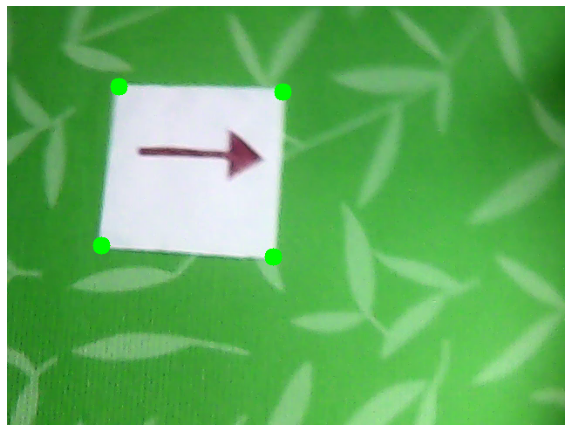

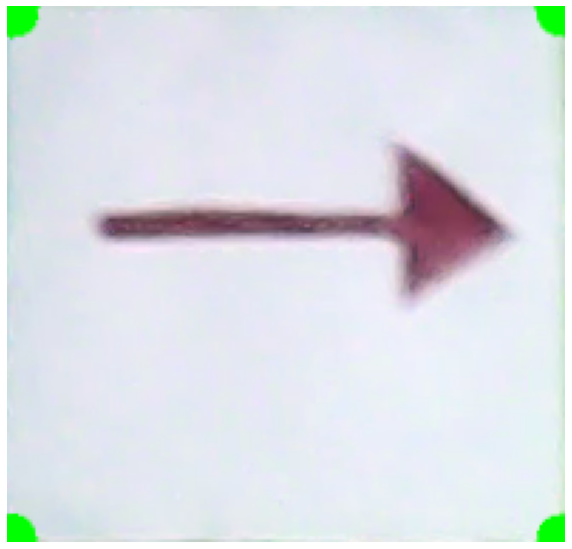

In [200]:
img = cv2.imread('/content/cvr_course/data/imgs/arrow/vlcsnap-2020-10-21-18h01m44s163.png')
approx = find_contour(img, (190, 190, 190), (255, 255, 255))

contour_marked = cv2.drawContours (img, approx, -1, (0, 255, 0), 20)

plt.imshow (contour_marked)
plt.axis ('off')
plt.show ()

warped = four_point_transform (img, np.asarray(approx) [:, 0, :])

plt.imshow (warped)
plt.axis ('off')
plt.show ()

3) [6 баллов] Реализуйте определение направления, в котором указывает стрелка. Можно использовать скелетонизацию из первого семинара по зрению: получить маску темной области (стрелки) внутри изображения листка, применить скелетонизацию, вычислить направление. Можно поступить иначе: после нахождения маски вычислить градиенты Собеля по x и y и проанализировать их направления. P.S. Можно использовать и полностью свой метод

In [240]:
def preprocess_img(img, verbose = False):

    kernel = np.ones((5, 5), 'uint8')
    dilate_img = cv2.dilate(img, kernel, iterations=1)

    img_hsv = cv2.cvtColor(dilate_img, cv2.COLOR_BGR2HSV)
    hsv_min = np.array((80, 0, 0), np.uint8)
    hsv_max = np.array((190, 255, 190), np.uint8)
    mask = cv2.inRange (img_hsv, hsv_min, hsv_max)
    if verbose:
        plt.imshow(mask)
        plt.axis('off')
        plt.title("Выделяем стрелку")
        plt.show()

    return mask

def find_2_points(img, radius = 200):

    poits_list = []
    for y in range(img.shape[0]):
        for x in range(img.shape[1]):
            if img[y][x] > 0:
                poits_list.append([x, y])

    amount_of_points = len(poits_list)
    max_distance = 0
    best_point1 = None
    best_point2 = None

    for id1 in range(amount_of_points):
        for id2 in range(amount_of_points):
            distance = (poits_list[id1][0] - poits_list[id2][0])**2 + (poits_list[id1][1] - poits_list[id2][1])**2
            if  distance > max_distance:
                max_distance = distance
                best_point1 = [poits_list[id1][0], poits_list[id1][1]]
                best_point2 = [poits_list[id2][0], poits_list[id2][1]]

    neighbors_point1 = 0
    neighbors_point2 = 0

    for id in range(amount_of_points):
        distance1 = (poits_list[id][0] - best_point1[0])**2 + (poits_list[id][1] - best_point1[1])**2
        distance2 = (poits_list[id][0] - best_point2[0])**2 + (poits_list[id][1] - best_point2[1])**2
        if distance1 < radius:
            neighbors_point1 += 1

        if distance2 < radius:
            neighbors_point2 += 1
    if neighbors_point1 <= neighbors_point2:
        return best_point1, best_point2
    else:
        return best_point2, best_point1

def find_angle(p1, p2):
    delta_x = p2[0] - p1[0]
    delta_y = -(p2[1] - p1[1])

    if delta_x > 0 and delta_y > 0: # 1-четверть
        return atan(delta_y/delta_x)*180/3.14
    if delta_x < 0 and delta_y > 0: # 2-четверть
        return atan(delta_y/delta_x)*180/3.14 + 180
    if delta_x < 0 and delta_y < 0: # 3-четверть
        return atan(delta_y/delta_x)*180/3.14 + 180
    if delta_x > 0 and delta_y < 0: # 4-четверть
        return atan(delta_y/delta_x)*180/3.14 + 360

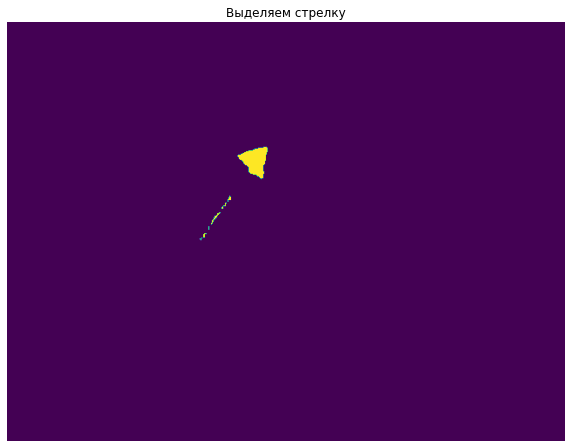

In [241]:

img = cv2.imread('/content/cvr_course/data/imgs/arrow/vlcsnap-2020-10-21-18h01m29s941.png', cv2.IMREAD_COLOR)
img0 = preprocess_img(img, verbose = True)

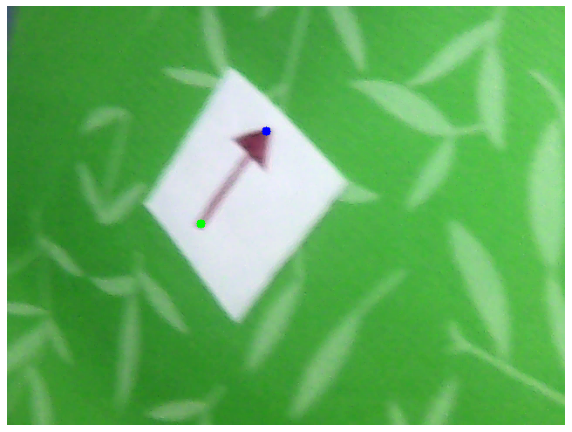

54.74654636869536

In [242]:
# находит две максимально удаленные точки друг от друга
# для стрелки это конец и острие
# для этих двух точек сравнивает количество ближайших соседей в определенном радиусе
# для острия эта величина больше
# возвращает точки в порядке конец, острие
p1, p2 = find_2_points(img0)

p1 = np.array(p1).reshape(1, 1, 2)
p2 = np.array(p2).reshape(1, 1, 2)

contour_marked = cv2.drawContours (img, p1, -1, (0, 255, 0), 10) # конец зеленый
contour_marked = cv2.drawContours (img, p2, -1, (0, 0, 255), 10) # острие синее
plt.imshow(img)
plt.axis('off')
plt.show()

p1 = np.array(p1).reshape(2)
p2 = np.array(p2).reshape(2)
find_angle(p1, p2) # пишет угол в градусах

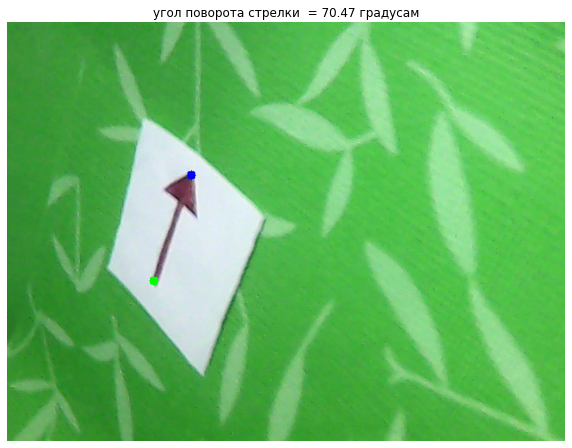

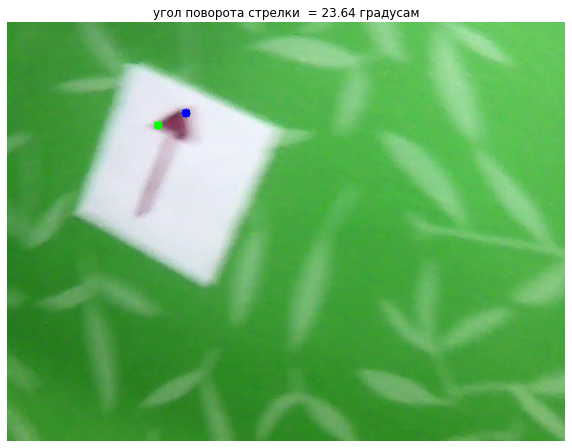

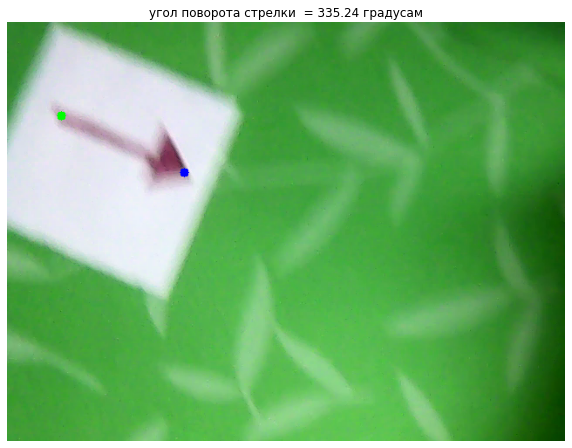

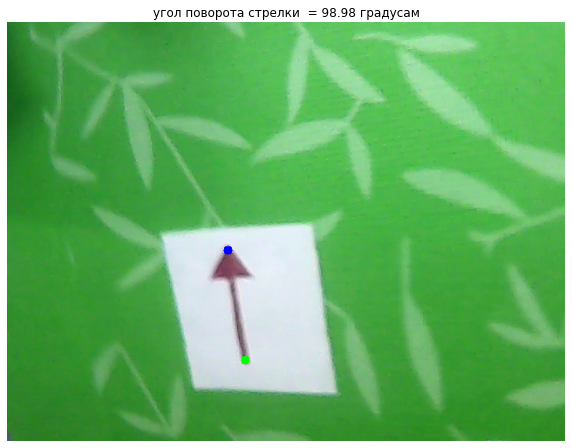

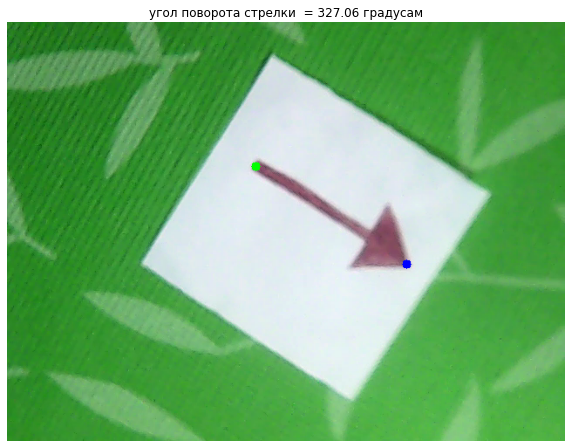

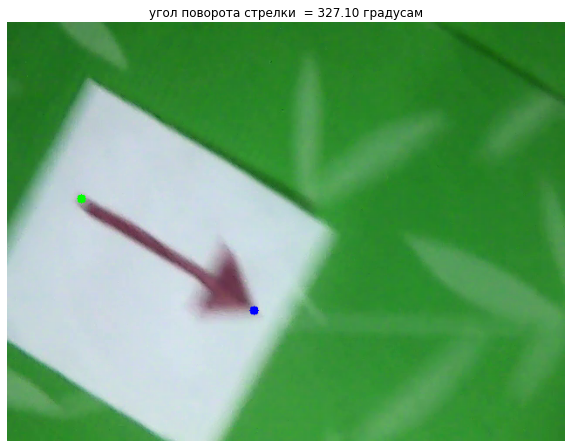

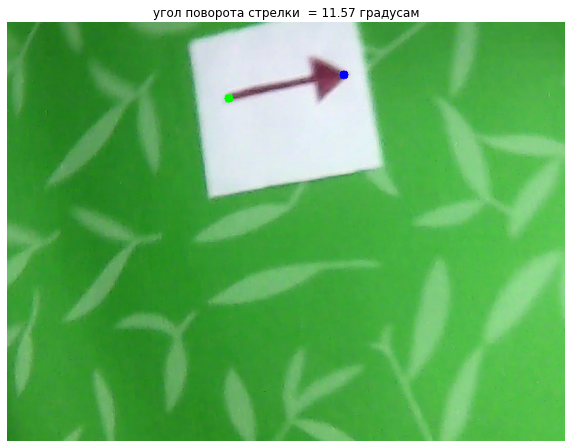

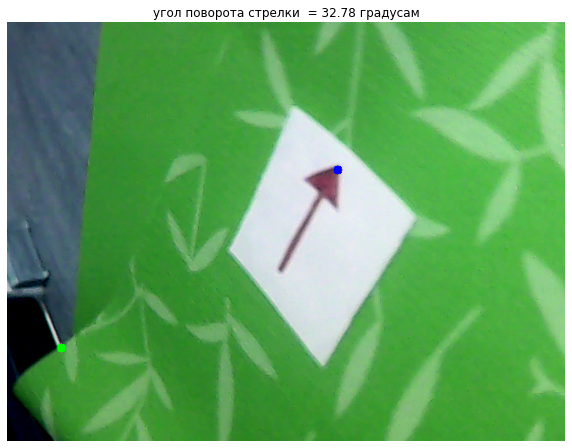

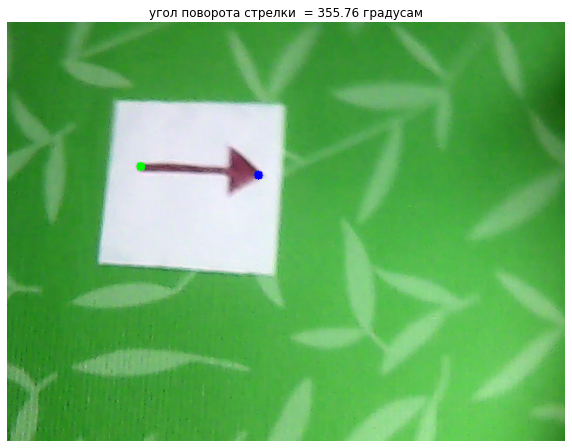

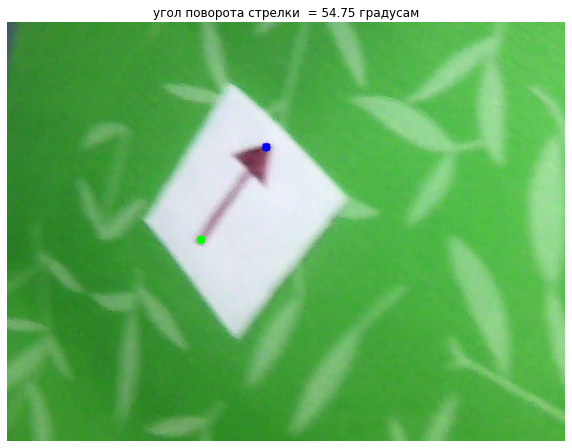

In [243]:
images = glob.glob('../data/imgs/arrow/*.png')
for fname in images:
    img = cv2.imread (fname, cv2.IMREAD_COLOR)
    img0 = preprocess_img(img)

    p1, p2 = find_2_points(img0)
    angle = find_angle(p1, p2)

    p1 = np.array(p1).reshape(1, 1, 2)
    p2 = np.array(p2).reshape(1, 1, 2)

    contour_marked = cv2.drawContours (img, p1, -1, (0, 255, 0), 10) # конец зеленый
    contour_marked = cv2.drawContours (img, p2, -1, (0, 0, 255), 10) # острие синее

    plt.imshow(img)
    plt.axis('off')
    plt.title("угол поворота стрелки  = {:.2f} градусам".format(angle))
    plt.show()

4) [3 балла] Доп. задача 1: Примените написанный Вами код к видео https://drive.google.com/file/d/1AQhg2lL5FL4edlOcxY2SHOOZ-v9TgHBD/view?usp=sharing. Загрузите видео на свой гугл диск, а затем дополните имеющийся код монтированием диска и чтением в цикле кадров видео, приведёнными в конце семинара

In [244]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


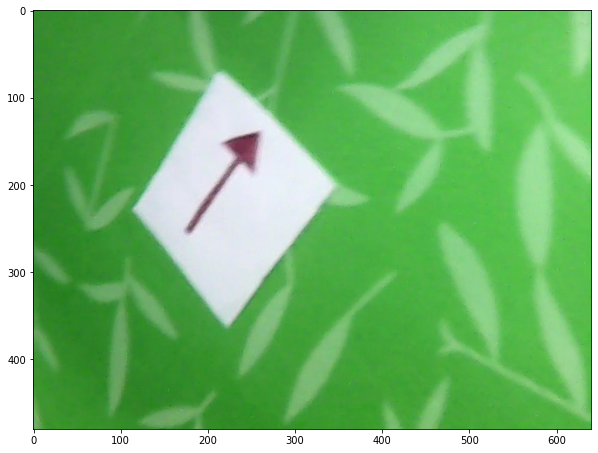

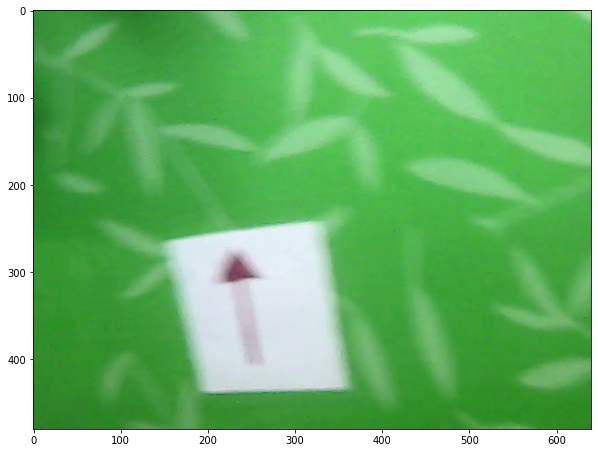

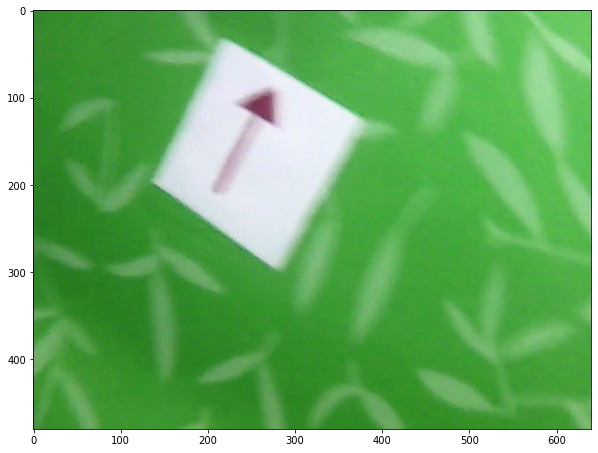

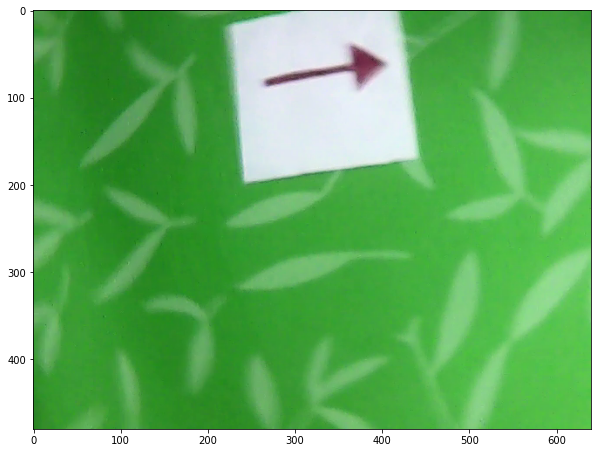

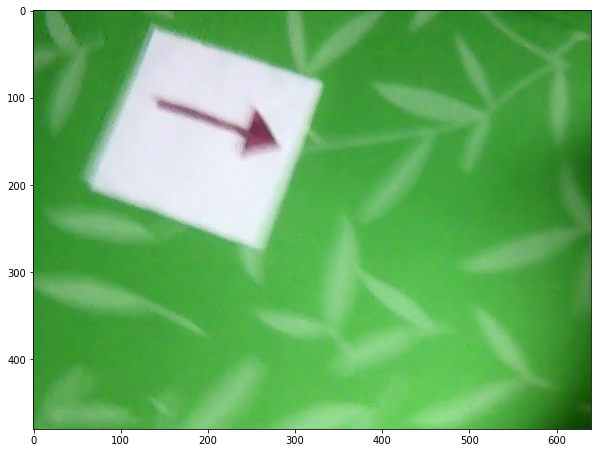

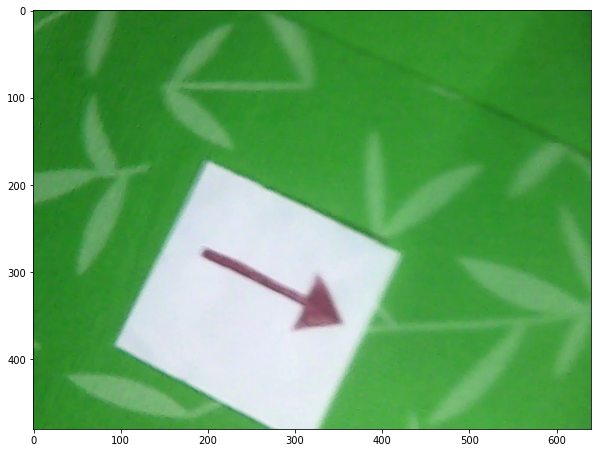

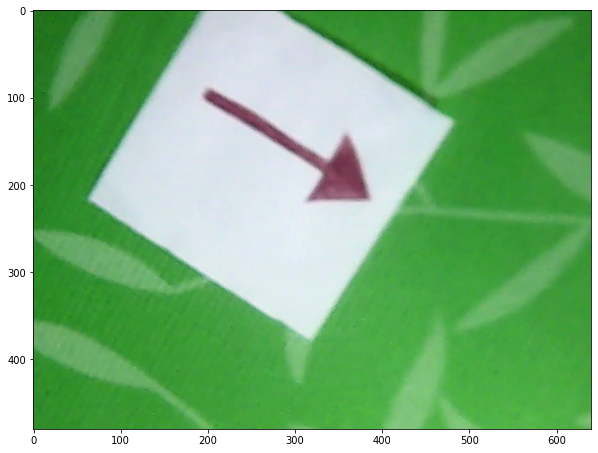

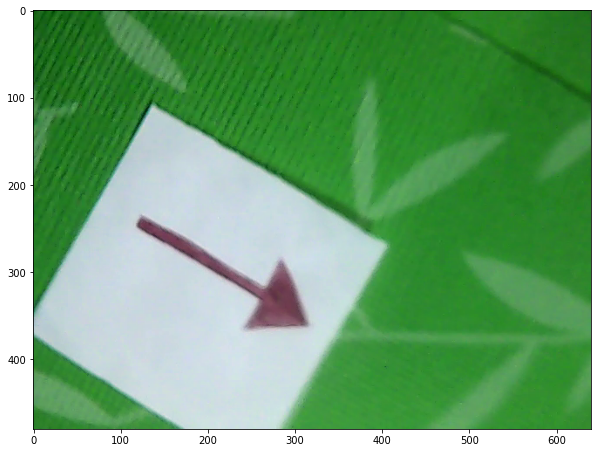

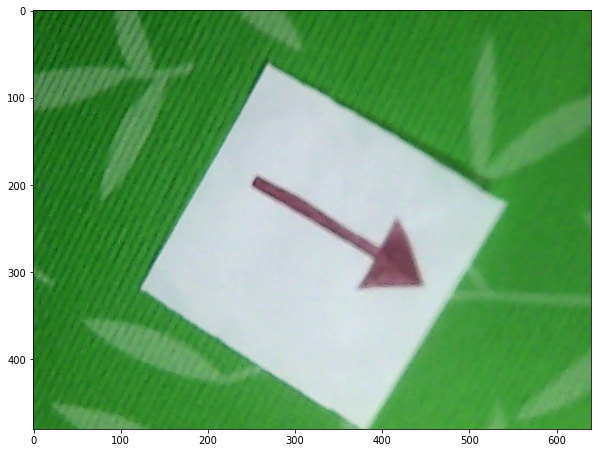

In [254]:
cap = cv2.VideoCapture('/content/drive/MyDrive/ЦИТИС CSV/3.mov')
i = 0

while(cap.isOpened()):
    ret, frame = cap.read()
    if frame is None: break
    
    i += 1
    if i % 24 == 0:
        plt.imshow(frame)
        plt.show()

cap.release()